## Segmentation Inference and Contrail Matching 

This notebook implements the time-synchronization between the images from Eurocontrol and IPSL and inference of the Mask2Former model developed for the ground camera at EIH. 

In [1]:
import sys
from pathlib import Path

# Add TRAILVISION library to path
trailvision_path = '/data/common/dataiku/config/projects/TRAILVISION/lib/python/'
if trailvision_path not in sys.path:
    sys.path.append(trailvision_path)

## Import Dependencies

In [2]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import datetime
import re
from tqdm import tqdm

# Try importing TRAILVISION components
try:
    from trailvision.data import COCOWithVideo, AeroFeatureCollection
    print("✓ Successfully imported trailvision.data")
    HAS_TRAILVISION = True
except ImportError as e:
    print(f"✗ Failed to import trailvision.data: {e}")
    HAS_TRAILVISION = False

# Try importing transformers and torch
try:
    import torch
    from transformers import (
        Mask2FormerImageProcessor,
        Mask2FormerForUniversalSegmentation,
    )
    print(f"✓ PyTorch {torch.__version__}")
    print(f"✓ CUDA available: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"  Device: {torch.cuda.get_device_name(0)}")
    print("✓ Transformers imported successfully")
except ImportError as e:
    print(f"✗ Failed to import torch/transformers: {e}")

✓ Successfully imported trailvision.data


2026-01-12 11:20:05.080249: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-12 11:20:05.136664: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-12 11:20:11.873744: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


✓ PyTorch 2.9.1+cu128
✓ CUDA available: True
  Device: NVIDIA RTX 6000 Ada Generation
✓ Transformers imported successfully


## Configuration and Paths

In [ ]:
# Set CUDA device - check on MobaXterm which GPU to use
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# Configuration as required by TRAILVISION segmentation inference
DATASET = "gQg5IUvV"  #  OdnkTZQ8 - ECTL dataset, gQx8W8pQ - IPSL dataset
task = "panoptic"  
model_size = "base"
run_id = "polygon"

# Image processing options
FLIP_IMAGES = True  # Set to True to flip images vertically (for IPSL dataset)

# Datasets configuration
workspace_dir = Path("/data/common/STEREOSTUDYIPSL")
datasets_dir = workspace_dir / "Datasets"
input_dir = datasets_dir / DATASET / "PROJECTED"
output_dir = datasets_dir / DATASET / "PREDICTIONS"

# Model import 
trailvision_dir = Path("/data/common/TRAILVISION")
segmentation_dir = trailvision_dir / "segmentation"
models_dir = segmentation_dir / "models"
checkpoint_dir = models_dir / task / run_id

# Altitude (projected at 11km)
altitude_km = 10.0
altitude_ft = altitude_km * 1000 / 0.3048

print(f"Dataset: {DATASET}")
print(f"Input directory: {input_dir}")
print(f"Input exists: {input_dir.exists()}")
print(f"Model checkpoint: {checkpoint_dir}")
print(f"Checkpoint exists: {checkpoint_dir.exists()}")
print(f"Projection altitude: {altitude_km} km ({altitude_ft:.0f} ft)")
print(f"Flip images: {'ENABLED' if FLIP_IMAGES else 'DISABLED'}")

# Create output directory
output_dir.mkdir(parents=True, exist_ok=True)

Dataset: gQg5IUvV
Input directory: /data/common/STEREOSTUDYIPSL/Datasets/gQg5IUvV/PROJECTED
Input exists: True
Model checkpoint: /data/common/TRAILVISION/segmentation/models/panoptic/polygon
Checkpoint exists: True
Projection altitude: 10.0 km (32808 ft)


## Load Model and Processor

In [4]:
# Base model from Hugging Face
base_model = f"facebook/mask2former-swin-{model_size}-coco-{task}"

# Define categories - use sky as background for panoptic segmentation
categories = [
    {"id": 1, "name": "contrail", "isthing": 1, "color": [255, 0, 0]},
]
if task == "panoptic": 
    background_category_id = len(categories) + 1
    categories.append(
        {
            "id": background_category_id,
            "name": "sky",
            "isthing": 0,
            "color": [135, 206, 235],
        }
    )

# Create id2label mapping (0-indexed for model)
id2label = {id: label["name"] for id, label in enumerate(categories)}
print(f"Categories: {id2label}")

# Image processor
processor = Mask2FormerImageProcessor.from_pretrained(
    base_model,
    do_resize=False,  # We handle resizing manually
    do_rescale=False,  # We handle rescaling manually
    do_normalize=True,  # Normalizes pixel values
    do_reduce_labels=True,  # Decreases label indices by 1
    ignore_index=255,  # Ignore label for padding/missing annotations
)

print("✓ Processor loaded")

Categories: {0: 'contrail', 1: 'sky'}
✓ Processor loaded


/data/dataiku/.conda/envs/mask2former/lib/python3.10/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


In [5]:
# Load model from checkpoint

def model_loading(checkpoint_dir, id2label):
    try:
        model = Mask2FormerForUniversalSegmentation.from_pretrained(
            checkpoint_dir,
            id2label=id2label,
            ignore_mismatched_sizes=True,
        )
        device = "cuda" if torch.cuda.is_available() else "cpu"
        model = model.to(device)
        # Set model to evaluation mode
        model.eval()
        print(f"  Model classes: {model.config.num_labels}")
    except Exception as e:
        print(f"✗ Failed to load model: {e}")
        raise
    return model

# Load the model
model = model_loading(checkpoint_dir, id2label)

  Model classes: 2


## Find Available Images

In [6]:
# Search for projected images
def find_projected_images(input_dir, count):
    projected_images = sorted(list(input_dir.glob('*.jpg')))

    print(f"Found {len(projected_images)} projected images")
    if len(projected_images) > 0:
        for img_file in projected_images[:count]:
            print(f"  {img_file.name}")
    else:
        print("No images found! Check the input directory.")
    return projected_images

projected_images = find_projected_images(input_dir, count=5)


Found 427 projected images
  20250406044600_01.jpg
  20250406044800_01.jpg
  20250406045000_01.jpg
  20250406045200_01.jpg
  20250406045400_01.jpg


## Define Inference Functions

In [ ]:
def extract_timestamp(filename: str) -> datetime.datetime:
    """
    Extract timestamp from projected image filename.
    
    Handles formats like:
    - 20250406044600_01_projected_11km.jpg
    - image_20250406050000_projected_11km.jpg
    """
    # Try pattern: YYYYMMDDHHMMSS
    match = re.search(r'(\d{14})', filename)
    if match:
        timestamp_str = match.group(1)
        return datetime.datetime.strptime(timestamp_str, '%Y%m%d%H%M%S')
    return None

def process_single_image(image_path, reference_image=None, threshold=0.5, mask_threshold=0.5, overlap_threshold=0.8, flip_image=None):
    """
    Run inference on a single image with optional histogram matching.
    
    Args:
        image_path: Path to the image to process
        reference_image: Reference image for histogram matching (numpy array or None)
        threshold: Detection threshold
        mask_threshold: Mask threshold
        overlap_threshold: Overlap threshold
        flip_image: Whether to flip image vertically (None uses FLIP_IMAGES global)
    
    Returns:
        Dictionary with segmentation results and metadata
    """
    # Load image
    image = np.array(Image.open(image_path).convert("RGB"))
    
    # Apply flip if enabled
    if flip_image is None:
        flip_image = FLIP_IMAGES
    
    if flip_image:
        image = cv2.flip(image, 0)
    
    # Apply histogram matching if reference provided
    if reference_image is not None:
        image = match_histogram(image, reference_image)
    
    # Extract timestamp
    timestamp = extract_timestamp(image_path.name)
    
    # Prepare inputs
    device = "cuda" if torch.cuda.is_available() else "cpu"
    inputs = processor([image], return_tensors="pt").to(device)
    
    # Run inference
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Post-process
    target_sizes = [image.shape[:2]]
    
    if task == "panoptic":
        # For panoptic segmentation
        kwargs = {
            "threshold": threshold,
            "mask_threshold": mask_threshold,
            "overlap_mask_area_threshold": overlap_threshold,
        }
        segmentation = processor.post_process_panoptic_segmentation(
            outputs,
            target_sizes=target_sizes,
            **kwargs
        )[0]
    else:  # instance
        # For instance segmentation
        kwargs = {
            "threshold": threshold,
            "mask_threshold": mask_threshold,
            "overlap_mask_area_threshold": overlap_threshold,
            "return_binary_maps": True,
        }
        segmentation = processor.post_process_instance_segmentation(
            outputs,
            target_sizes=target_sizes,
            **kwargs
        )[0]
    
    return {
        'filename': image_path.name,
        'timestamp': timestamp,
        'segmentation': segmentation,
        'image': image,
        'image_shape': image.shape[:2],
    }

print("✓ Inference functions defined")

✓ Inference functions defined


In [ ]:
# Apply histogram equalization to enhance contrast

import cv2
from skimage import exposure
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from typing import List
from PIL import Image
import os
import cv2

def compute_color_histogram(image_paths: List[str], num_samples: int = 50) -> np.ndarray:
    if len(image_paths) == 0:
        print("Error: No images provided")
        return None
    
    samples = min(num_samples, len(image_paths))
    sampled_paths = np.random.choice(image_paths, samples, replace=False)
    
    all_images = []
    print(f"Computing color histogram from {samples} sample images...")
    
    for path in tqdm(sampled_paths, desc="Loading samples"):
        try:
            img = Image.open(path)
            # Convert to RGB if needed
            if img.mode != 'RGB':
                img = img.convert('RGB')
            img_array = np.array(img)
            
            # Ensure image has valid shape
            if len(img_array.shape) == 3 and img_array.shape[2] == 3:
                all_images.append(img_array)
            else:
                print(f"Skipping {os.path.basename(path)}: invalid shape {img_array.shape}")
        except Exception as e:
            print(f"Error loading {os.path.basename(path)}: {e}")
            continue
    
    if not all_images:
        print("Error: No valid images loaded")
        return None
    
    print(f"Successfully loaded {len(all_images)} images")
    
    # Find common dimensions (use the most common size)
    shapes = [img.shape for img in all_images]
    from collections import Counter
    most_common_shape = Counter(shapes).most_common(1)[0][0]
    print(f"Using shape: {most_common_shape}")
    
    # Filter images to match common shape
    filtered_images = [img for img in all_images if img.shape == most_common_shape]
    
    if not filtered_images:
        print("Error: No images with matching dimensions")
        return None
    
    # Compute mean image as reference
    mean_image = np.mean(filtered_images, axis=0).astype(np.uint8)
    return mean_image


def match_histogram(img1, img2) -> np.ndarray:
    """
    Match the histogram of source image to reference image.
    
    Args:
        source_image: Image to transform (RGB)
        reference_image: Reference image with target histogram (RGB)
        
    Returns:
        Histogram-matched image
    """
    # Load images if they are file paths
    def load_img(img):
        if isinstance(img, str):
            # It's a file path
            loaded = Image.open(img)
            if loaded.mode != 'RGB':
                loaded = loaded.convert('RGB')
            return np.array(loaded)
        else:
            # Already a numpy array
            return img
    
    img1_array = load_img(img1)
    img2_array = load_img(img2)
    
    # Apply histogram matching per channel
    matched = exposure.match_histograms(img1_array, img2_array, channel_axis=2)
    return matched.astype(np.uint8)


def visualize_histograms(img1, img2, img2_matched=None):
    """
    Visualize color histograms for comparison.
    
    Args:
        img1: Dataset 1 image (file path or numpy array)
        img2: Dataset 2 original image (file path or numpy array)
        img2_matched: Dataset 2 image after histogram matching (file path or numpy array, optional)
    """
    # Load images if they are file paths
    def load_img(img):
        if isinstance(img, str):
            # It's a file path
            loaded = Image.open(img)
            if loaded.mode != 'RGB':
                loaded = loaded.convert('RGB')
            return np.array(loaded)
        else:
            # Already a numpy array
            return img
    
    img1_array = load_img(img1)
    img2_array = load_img(img2)
    img2_matched_array = load_img(img2_matched) if img2_matched is not None else None
    
    colors = ['red', 'green', 'blue']
    labels = ['Red', 'Green', 'Blue']
    
    num_plots = 3 if img2_matched_array is not None else 2
    fig, axes = plt.subplots(2, num_plots, figsize=(6*num_plots, 8))
    
    # Show images
    axes[0, 0].imshow(img1_array)
    axes[0, 0].set_title('Dataset 1 (Reference)', fontweight='bold')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(cv2.flip(img2_array, 0))
    axes[0, 1].set_title('Dataset 2 (Original)', fontweight='bold')
    axes[0, 1].axis('off')
    
    if img2_matched_array is not None:
        axes[0, 2].imshow(img2_matched_array)
        axes[0, 2].set_title('Dataset 2 (Matched)', fontweight='bold')
        axes[0, 2].axis('off')
    
    # Plot histograms
    for i, (color, label) in enumerate(zip(colors, labels)):
        # Dataset 1 histogram
        hist1, bins1 = np.histogram(img1_array[:,:,i].flatten(), bins=256, range=(0, 256))
        axes[1, 0].plot(bins1[:-1], hist1, color=color, alpha=0.7, label=label)
        
        # Dataset 2 original histogram
        hist2, bins2 = np.histogram(img2_array[:,:,i].flatten(), bins=256, range=(0, 256))
        axes[1, 1].plot(bins2[:-1], hist2, color=color, alpha=0.7, label=label)
        
        # Dataset 2 matched histogram
        if img2_matched_array is not None:
            hist3, bins3 = np.histogram(img2_matched_array[:,:,i].flatten(), bins=256, range=(0, 256))
            axes[1, 2].plot(bins3[:-1], hist3, color=color, alpha=0.7, label=label)
    
    axes[1, 0].set_title('Dataset 1 Histogram')
    axes[1, 0].set_xlabel('Pixel Value')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].legend()
    axes[1, 0].grid(alpha=0.3)
    
    axes[1, 1].set_title('Dataset 2 Original Histogram')
    axes[1, 1].set_xlabel('Pixel Value')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].legend()
    axes[1, 1].grid(alpha=0.3)
    
    if img2_matched_array is not None:
        axes[1, 2].set_title('Dataset 2 Matched Histogram')
        axes[1, 2].set_xlabel('Pixel Value')
        axes[1, 2].set_ylabel('Frequency')
        axes[1, 2].legend()
        axes[1, 2].grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

print("✓ Histogram matching functions defined")

✓ Histogram matching functions defined


In [9]:
# Extract a reference image from Dataset 1

datasets_dir = Path("/data/common/STEREOSTUDYIPSL/Datasets")
dataset1_dir = datasets_dir / "OdnkTZQ8" / "PROJECTED"

dataset1_images = sorted(list(dataset1_dir.glob('*.jpg')))

if len(dataset1_images) > 0:
    reference_image_path = dataset1_images[0]
    print(f"Reference image from Dataset 1: {reference_image_path.name}")
    
    # Load the reference image as numpy array
    reference_image = np.array(Image.open(reference_image_path).convert("RGB"))
    print(f"Reference image shape: {reference_image.shape}")
    print("✓ Reference image loaded for histogram matching")
else:
    reference_image = None
    reference_image_path = None
    print("⚠ No images found in Dataset 1 - histogram matching will be skipped")

Reference image from Dataset 1: image_20250406050000.jpg
Reference image shape: (1024, 1024, 3)
✓ Reference image loaded for histogram matching


## Test on First Image

In [ ]:
if len(projected_images) > 0:
    print(f"Processing: {projected_images[0].name}")
    
    # Use reference_image if it exists (from previous cell), otherwise None
    ref_img = reference_image if 'reference_image' in locals() and reference_image is not None else None
    
    # Load image
    test_image = np.array(Image.open(projected_images[0]).convert("RGB"))
    
    # Flip if enabled
    if FLIP_IMAGES:
        test_image = cv2.flip(test_image, 0)
        print("  Image flipped vertically")
    
    # Process with histogram matching if reference available
    if ref_img is not None:
        test_image = match_histogram(test_image, ref_img)
    
    # Create a temporary result for testing
    result = process_single_image(projected_images[0], reference_image=ref_img)
    
    print(f"\n✓ Inference completed")
    print(f"  Filename: {result['filename']}")
    print(f"  Timestamp: {result['timestamp']}")
    print(f"  Image shape: {result['image_shape']}")
    print(f"  Segmentation keys: {result['segmentation'].keys()}")
    print(f"  Histogram matching: {'Applied' if ref_img is not None else 'Skipped'}")
    print(f"  Flip: {'Applied' if FLIP_IMAGES else 'Skipped'}")
else:
    print("No images available for testing")

Processing: 20250406044600_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.



✓ Inference completed
  Filename: 20250406044600_01.jpg
  Timestamp: 2025-04-06 04:46:00
  Image shape: (2464, 2464)
  Segmentation keys: dict_keys(['segmentation', 'segments_info'])
  Histogram matching: Applied


## Visualization Function

In [11]:
def visualize_segmentation(result, figsize=(15, 5)):
    """
    Visualize original image, segmentation mask, and overlay.
    """
    image = result['image']
    segmentation = result['segmentation']
    
    fig, axes = plt.subplots(1, 3, figsize=figsize)
    
    # Original image
    axes[0].imshow(image)
    axes[0].set_title(f"Original\n{result['filename']}")
    axes[0].axis('off')
    
    # Segmentation mask
    if 'segmentation' in segmentation:
        seg_mask = segmentation['segmentation'].cpu().numpy()
        axes[1].imshow(seg_mask, cmap='tab20')
        axes[1].set_title('Segmentation Mask')
        axes[1].axis('off')
        
        # Overlay
        axes[2].imshow(image)
        axes[2].imshow(seg_mask, alpha=0.5, cmap='tab20')
        axes[2].set_title('Overlay')
        axes[2].axis('off')
    
    # Print segment info
    if 'segments_info' in segmentation:
        print(f"\nSegments detected: {len(segmentation['segments_info'])}")
        for i, seg_info in enumerate(segmentation['segments_info'][:5]):  # Show first 5
            label_id = seg_info['label_id']
            label_name = id2label.get(label_id, 'unknown')
            score = seg_info.get('score', 0)
            print(f"  Segment {i+1}: {label_name} (score: {score:.3f})")
    
    plt.tight_layout()
    plt.show()

print("✓ Visualization function defined")

✓ Visualization function defined


## Display Results for First Image


Segments detected: 1
  Segment 1: sky (score: 1.000)


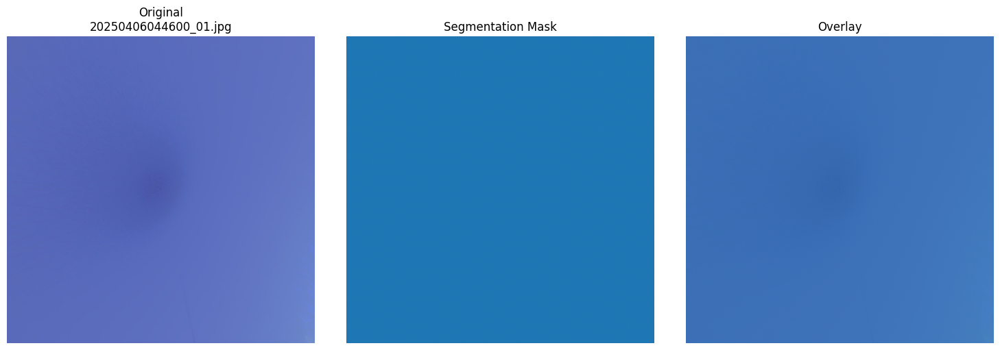

In [12]:
if len(projected_images) > 0 and 'result' in locals():
    visualize_segmentation(result)
else:
    print("Run previous cells first to generate results")

## Process First Few Images (3-5 images)

In [13]:
# Process first N images with histogram matching
N = min(20, len(projected_images))

# Use reference_image if available from earlier cells
ref_img = reference_image if 'reference_image' in locals() and reference_image is not None else None

print(f"Processing first {N} images with histogram matching...\n")
if ref_img is not None and 'reference_image_path' in locals():
    print(f"Reference image: {reference_image_path.name}\n")
else:
    print("Reference image: None (histogram matching will be skipped)\n")

results = []
for i, image_path in enumerate(projected_images[:N]):
    print(f"[{i+1}/{N}] Processing: {image_path.name}")
    try:
        result = process_single_image(image_path, reference_image=ref_img)
        results.append(result)
        
        # Print summary
        n_segments = len(result['segmentation'].get('segments_info', []))
        print(f"  ✓ Found {n_segments} segments")
        
    except Exception as e:
        print(f"  ✗ Error: {e}")

print(f"\nSuccessfully processed {len(results)}/{N} images")
print(f"Histogram matching: {'Applied' if ref_img is not None else 'Skipped'}")

Processing first 20 images with histogram matching...

Reference image: image_20250406050000.jpg

[1/20] Processing: 20250406044600_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[2/20] Processing: 20250406044800_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[3/20] Processing: 20250406045000_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[4/20] Processing: 20250406045200_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[5/20] Processing: 20250406045400_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[6/20] Processing: 20250406045600_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[7/20] Processing: 20250406045800_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[8/20] Processing: 20250406050000_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[9/20] Processing: 20250406050200_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[10/20] Processing: 20250406050400_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[11/20] Processing: 20250406050600_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[12/20] Processing: 20250406050800_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 2 segments
[13/20] Processing: 20250406051000_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 2 segments
[14/20] Processing: 20250406051200_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 5 segments
[15/20] Processing: 20250406051400_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[16/20] Processing: 20250406051600_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 2 segments
[17/20] Processing: 20250406051800_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[18/20] Processing: 20250406052000_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[19/20] Processing: 20250406052200_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments
[20/20] Processing: 20250406052400_01.jpg


`label_ids_to_fuse` unset. No instance will be fused.


  ✓ Found 1 segments

Successfully processed 20/20 images
Histogram matching: Applied


## Visualize All Processed Images


Image 1/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


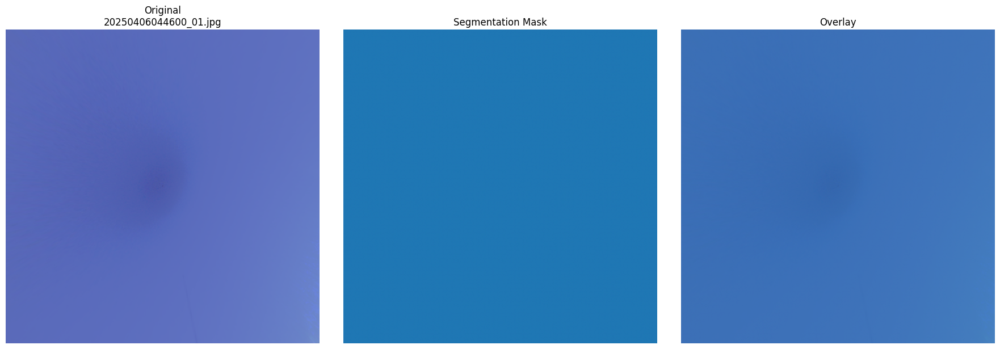


Image 2/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


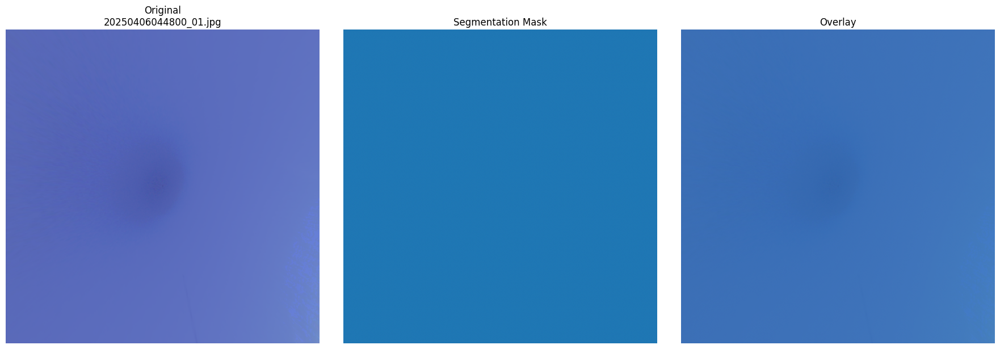


Image 3/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


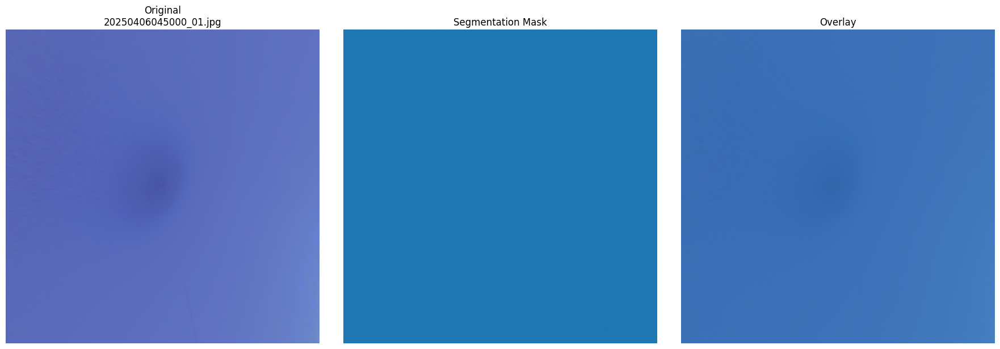


Image 4/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


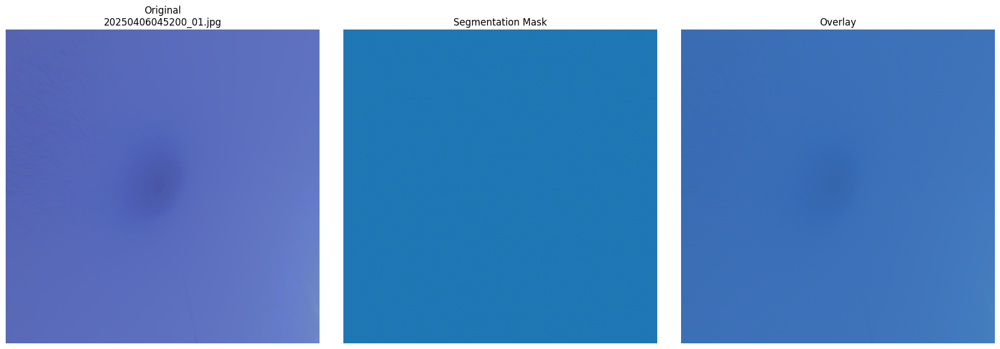


Image 5/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


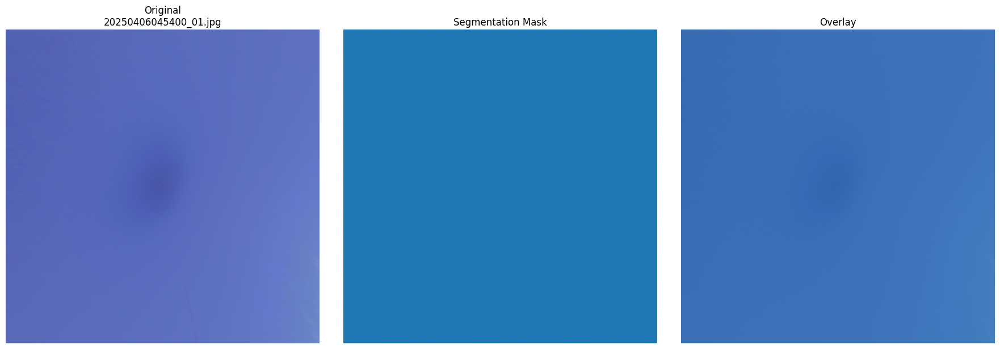


Image 6/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


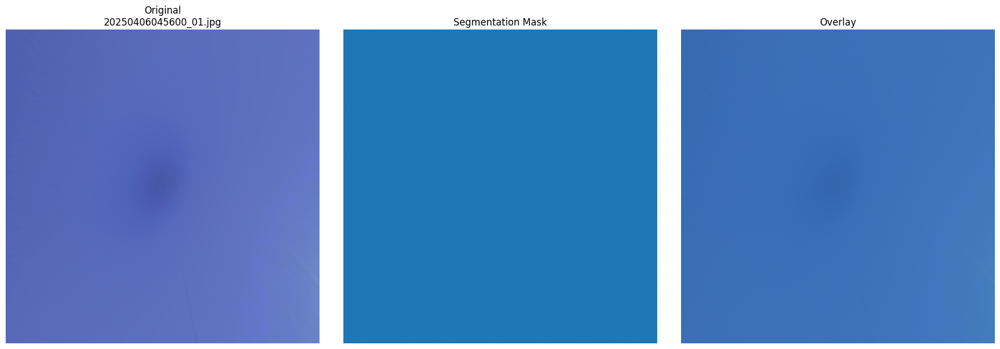


Image 7/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


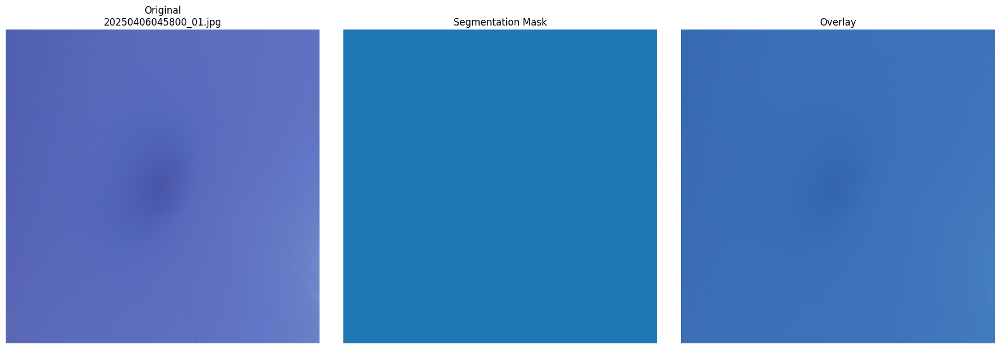


Image 8/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


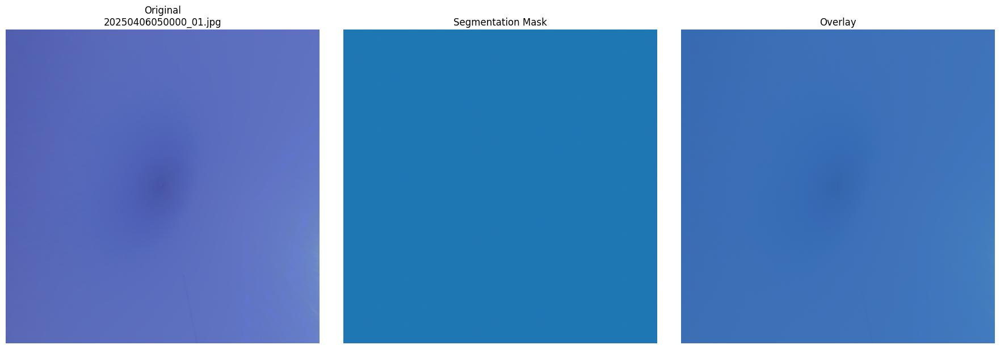


Image 9/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


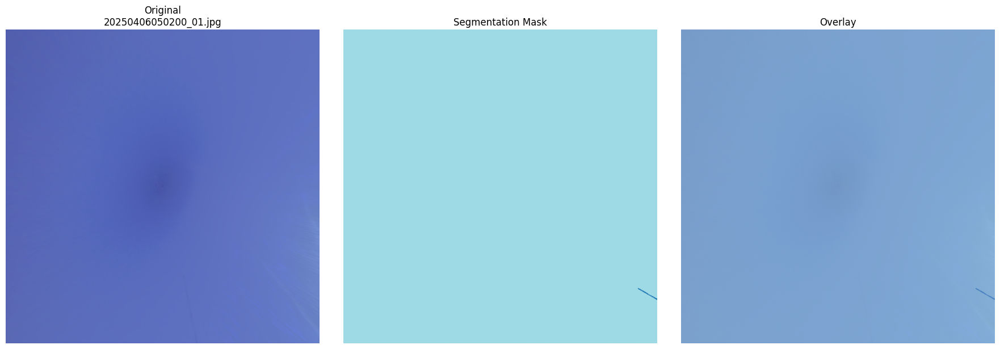


Image 10/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


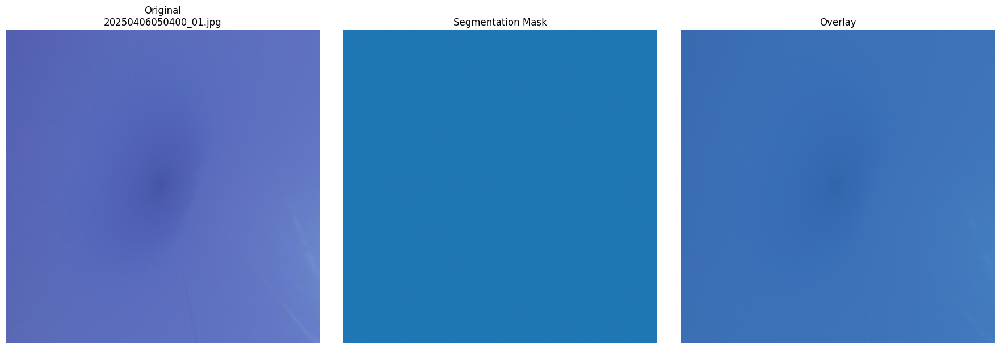


Image 11/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


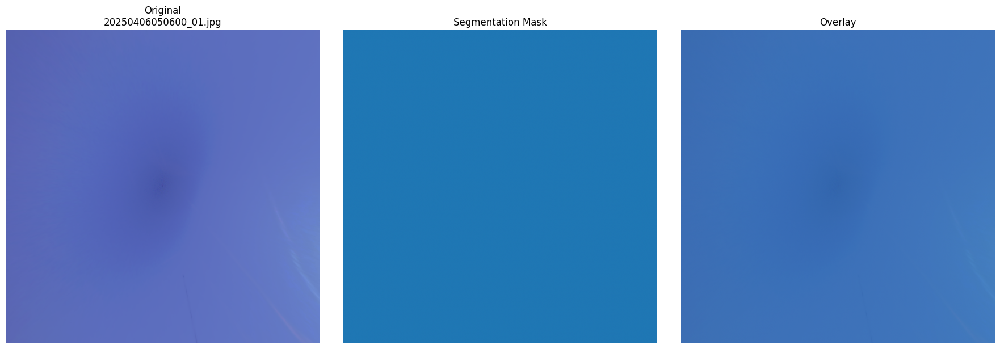


Image 12/20

Segments detected: 2
  Segment 1: sky (score: 1.000)
  Segment 2: contrail (score: 0.828)


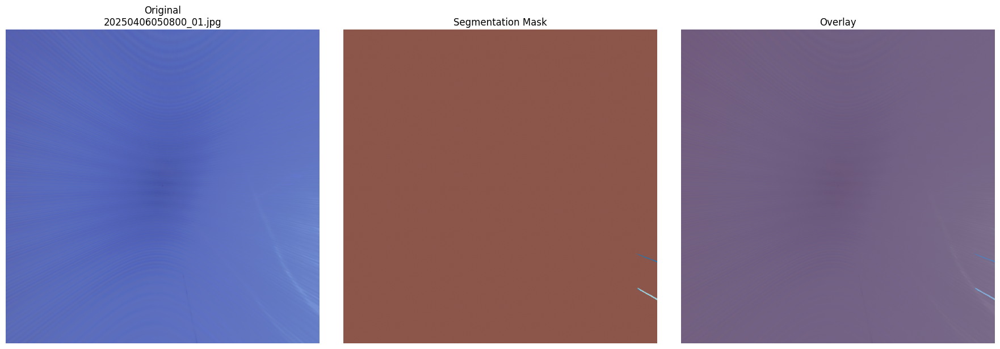


Image 13/20

Segments detected: 2
  Segment 1: sky (score: 1.000)
  Segment 2: contrail (score: 0.996)


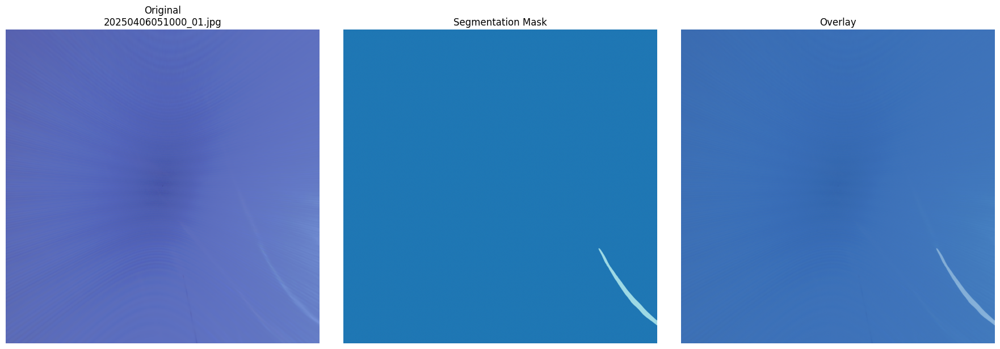


Image 14/20

Segments detected: 5
  Segment 1: contrail (score: 0.951)
  Segment 2: sky (score: 1.000)
  Segment 3: contrail (score: 0.948)
  Segment 4: contrail (score: 0.911)
  Segment 5: contrail (score: 0.718)


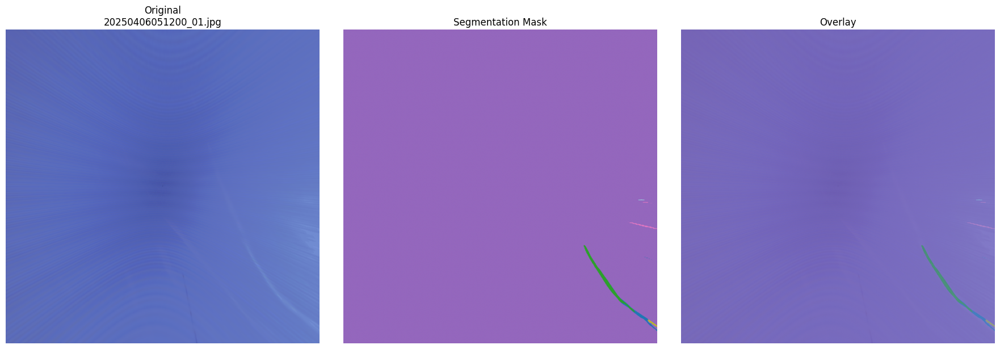


Image 15/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


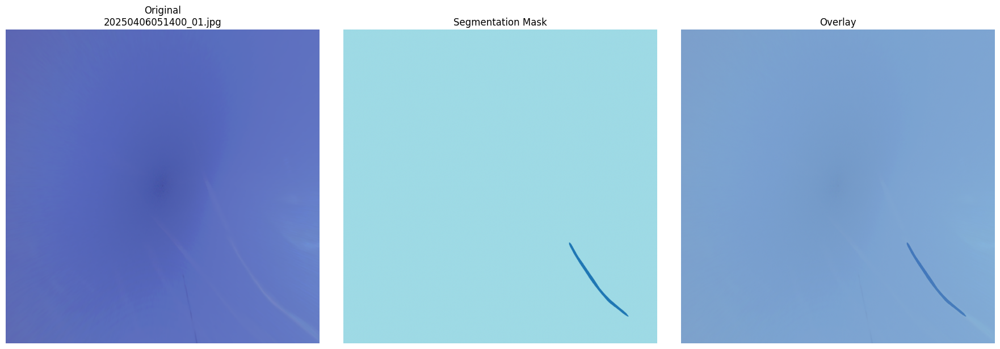


Image 16/20

Segments detected: 2
  Segment 1: sky (score: 1.000)
  Segment 2: contrail (score: 0.894)


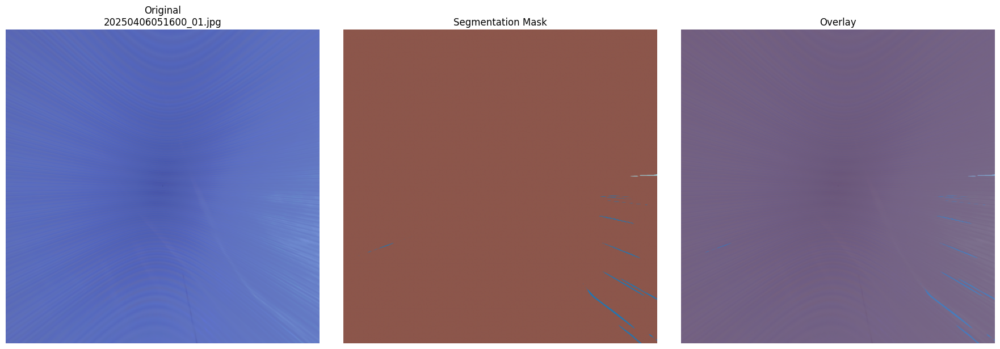


Image 17/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


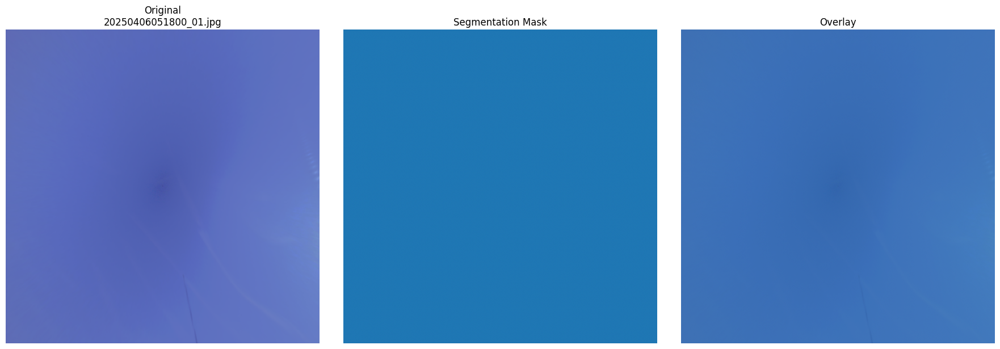


Image 18/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


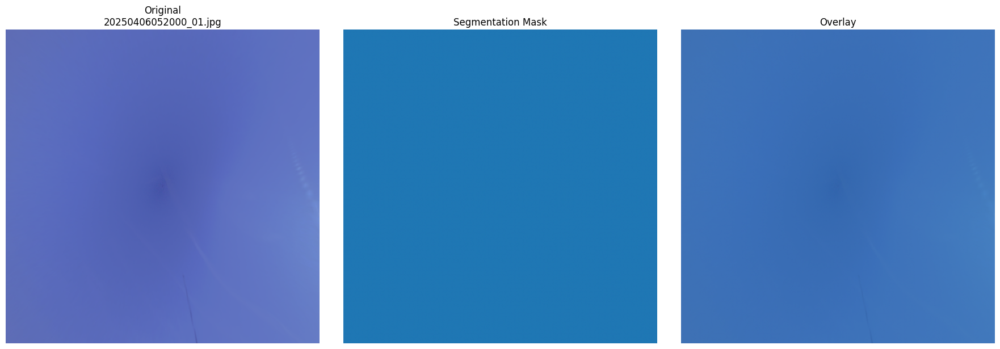


Image 19/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


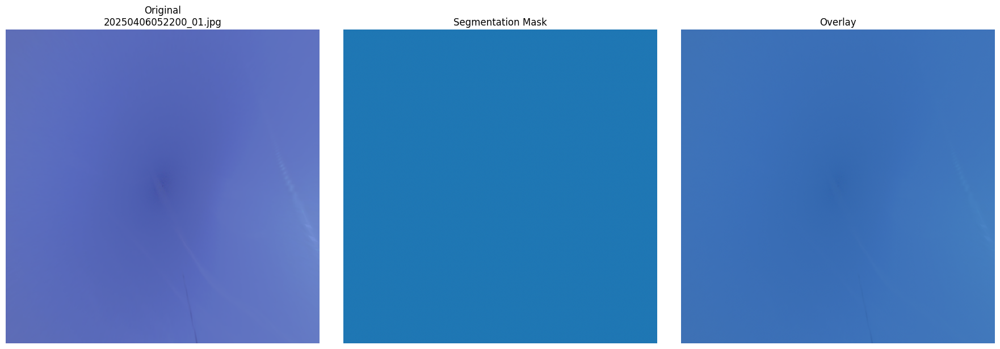


Image 20/20

Segments detected: 1
  Segment 1: sky (score: 1.000)


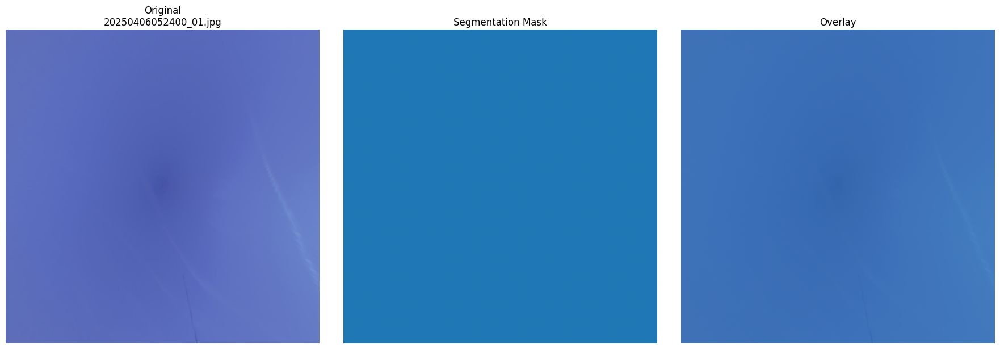

In [14]:
# Display each result
for i, result in enumerate(results):
    print(f"\n{'='*80}")
    print(f"Image {i+1}/{len(results)}")
    print(f"{'='*80}")
    visualize_segmentation(result, figsize=(18, 6))

## Summary Statistics

In [15]:
if len(results) > 0:
    print("Summary Statistics")
    print("=" * 50)
    
    total_segments = []
    contrail_segments = []
    
    for result in results:
        segments_info = result['segmentation'].get('segments_info', [])
        total_segments.append(len(segments_info))
        
        # Count contrails
        n_contrails = sum(1 for seg in segments_info 
                         if id2label.get(seg['label_id'], '') == 'contrail')
        contrail_segments.append(n_contrails)
    
    print(f"Images processed: {len(results)}")
    print(f"Total segments detected: {sum(total_segments)}")
    print(f"Avg segments per image: {np.mean(total_segments):.1f}")
    print(f"Contrail segments: {sum(contrail_segments)}")
    print(f"Avg contrails per image: {np.mean(contrail_segments):.1f}")
    print(f"\nSegments per image: {total_segments}")
    print(f"Contrails per image: {contrail_segments}")

Summary Statistics
Images processed: 20
Total segments detected: 31
Avg segments per image: 1.6
Contrail segments: 11
Avg contrails per image: 0.6

Segments per image: [1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 3, 1, 1, 1, 2, 1, 3, 2, 1, 3]
Contrails per image: [0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 1, 0, 2, 1, 0, 2]


## Next Steps

Once the inference works well on the first few images:

1. **Batch process all images** in the dataset
2. **Save predictions** to disk (npz or parquet format)
3. **Integrate with AeroFeatureCollection** if TRAILVISION available
4. **Process second dataset** (OdnkTZQ8)
5. **Compare results** between stereo camera pairs
6. **Triangulation** using predictions from both cameras

## Search for Images with Contrails

Let's process more images to find contrails